___
<a href='http://www.kgptalkie.com'><img src='kgptalkie_strips.png'/></a>
___

<center><em>Copyright by KGPTalkie</em></center>
<center><em>For free ML tutorials, visit us at <a href='http://www.kgptalkie.com'>www.kgptalkie.com</a></em></center>

## Support Vector Machines (SVM)

#### Lecture Timeline
- Introduction
- Dataset Analysis
- Model Building
- Training, Testing and Evaluation

The goal of the SVM algorithm is to create the best line or decision boundary that can segregate n-dimensional space into classes so that we can easily put the new data point in the correct category in the future. This best decision boundary is called a hyperplane.

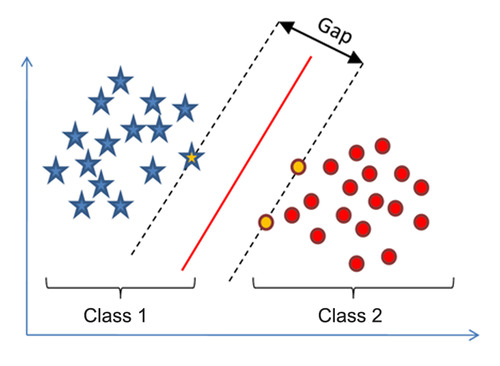

A SVM classifier would attempt to draw a straight line separating the two sets of data, and thereby create a model for classification. For two dimensional data like that shown here, this is a task we could do by hand. But immediately we see a problem: there is more than one possible dividing line that can perfectly discriminate between the two classes!

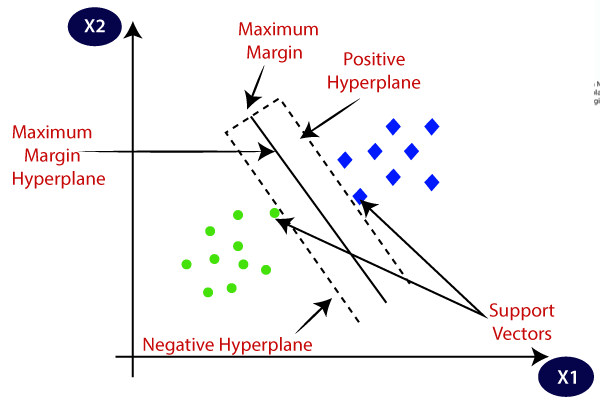

- Support Vectors
- Hyperplane
- Margin

#### Support Vectors

Support vectors are the data points, which are closest to the hyperplane. These points will define the separating line better by calculating margins. These points are more relevant to the construction of the classifier.

#### Hyperplane 

A hyperplane is a decision plane which separates between a set of objects having different class memberships.

#### Margin 

A margin is a gap between the two lines on the closest class points. This is calculated as the perpendicular distance from the line to support vectors or closest points. If the margin is larger in between the classes, then it is considered a good margin, a smaller margin is a bad margin.

#### How SVM works?

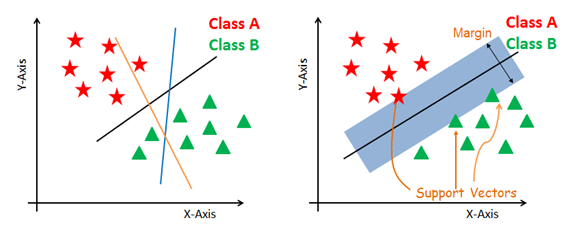

- Generate hyperplanes which segregates the classes in the best way. Left-hand side figure showing three hyperplanes black, blue and orange. Here, the blue and orange have higher classification error, but the black is separating the two classes correctly.

- Select the right hyperplane with the maximum segregation from the either nearest data points as shown in the right-hand side figure.

#### Separation Planes
- Linear
- Non-Linear

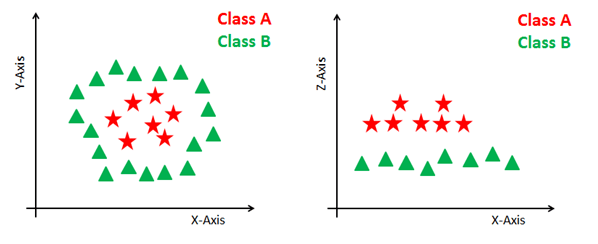

#### Dealing with non-linear and inseparable planes

SVM uses a kernel trick to transform the input space to a higher dimensional space

#### SVM Kernels

- Linear
- Polynomial
- Radial Basis Function

The SVM algorithm is implemented in practice using a kernel. Kernel helps you to build a more accurate classifier.

- A linear kernel can be used as normal dot product any two given observations. The product between two vectors is the sum of the multiplication of each pair of input values.

- A polynomial kernel is a more generalized form of the linear kernel. The polynomial kernel can distinguish curved or nonlinear input space

- The Radial basis function (RBF) kernel is a popular kernel function commonly used in support vector machine classification. RBF can map an input space in infinite dimensional space.

#### Breast Tumor Dataset
https://scikit-learn.org/stable/datasets/toy_dataset.html#breast-cancer-wisconsin-diagnostic-dataset


- Breast cancer happens when cells in the breast grow and divide in an uncontrolled way, creating a mass of tissue called a tumor.
    - Breast Exam
    - Mammogram (X-Ray)
    - Ultrasound
    - Biopsy
    - MRI
    
 

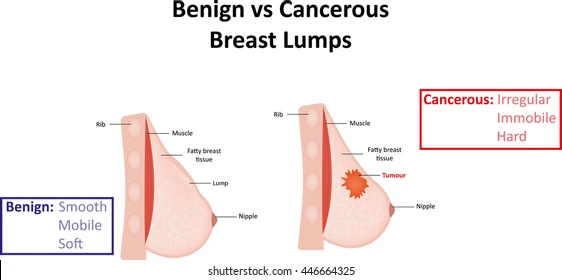

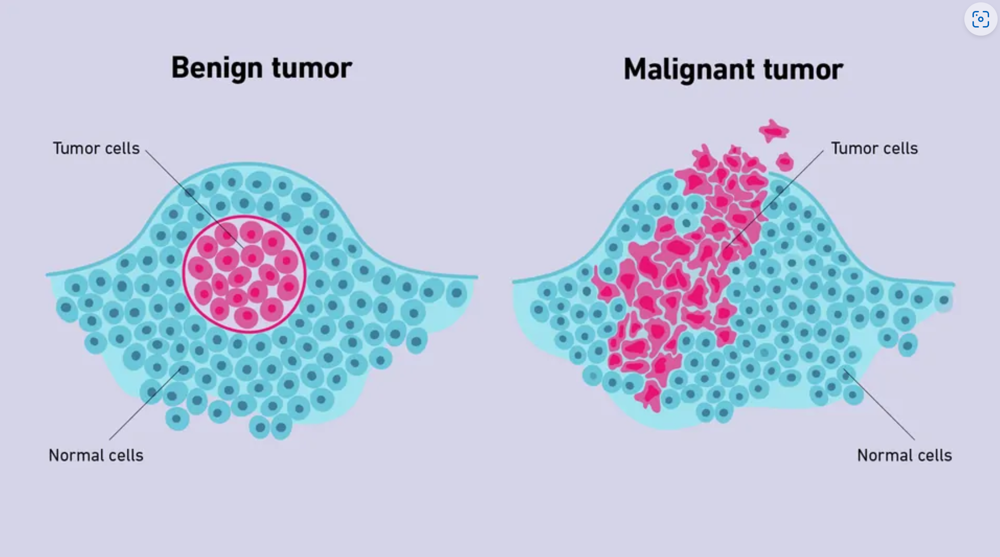

- Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.
- Fine needle aspiration is a type of biopsy procedure.

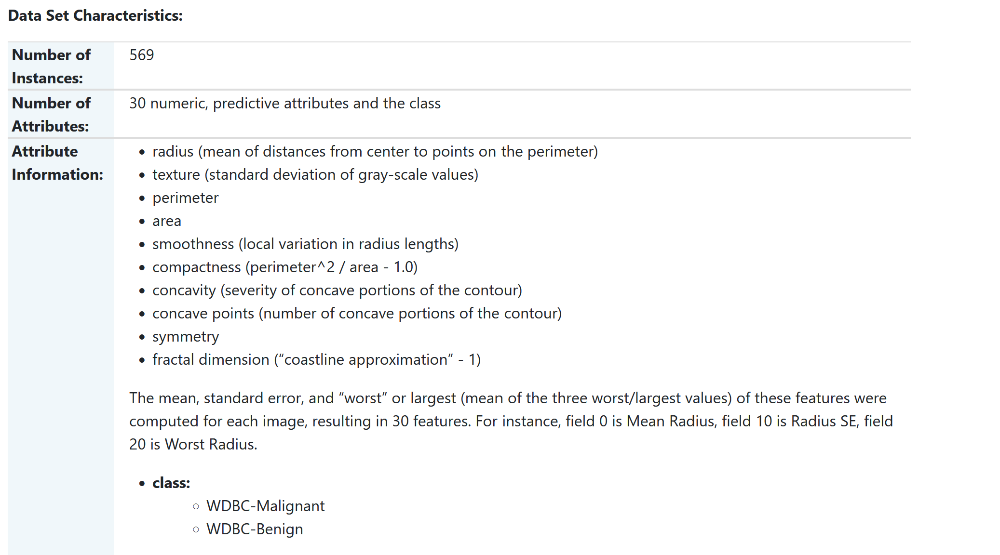

#### Let's Build Model in sklearn

##### Dataset Loading

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [3]:
cancer = datasets.load_breast_cancer()

In [5]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [13]:
print(cancer.feature_names)

['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


In [18]:
X = cancer.data
y = cancer.target
X.shape, y.shape

# {0:malignant, 1:benign}

((569, 30), (569,))

In [22]:
sum(y), len(y)-sum(y)

(357, 212)

[Text(0, 0, '212'), Text(0, 0, '357')]

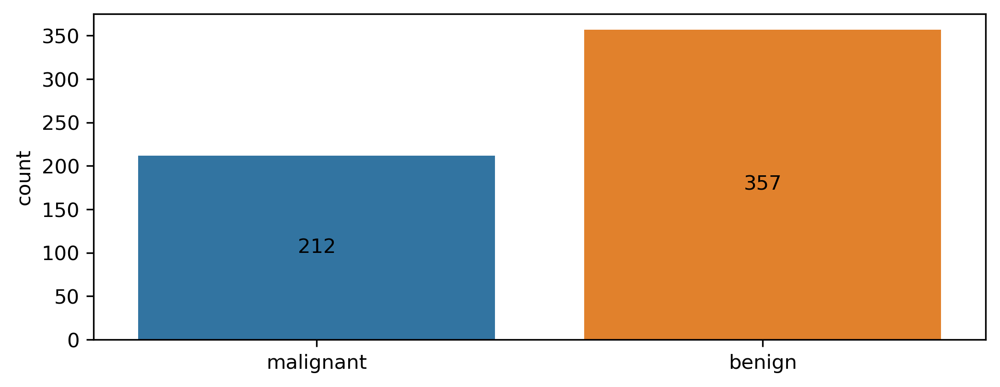

In [34]:
plt.rcParams['figure.figsize'] = [8,3]
plt.rcParams['figure.dpi'] = 300
ax = sns.countplot(x=y, label='Count')
plt.xticks(np.arange(2), cancer.target_names)
ax.bar_label(ax.containers[0], label_type='center')

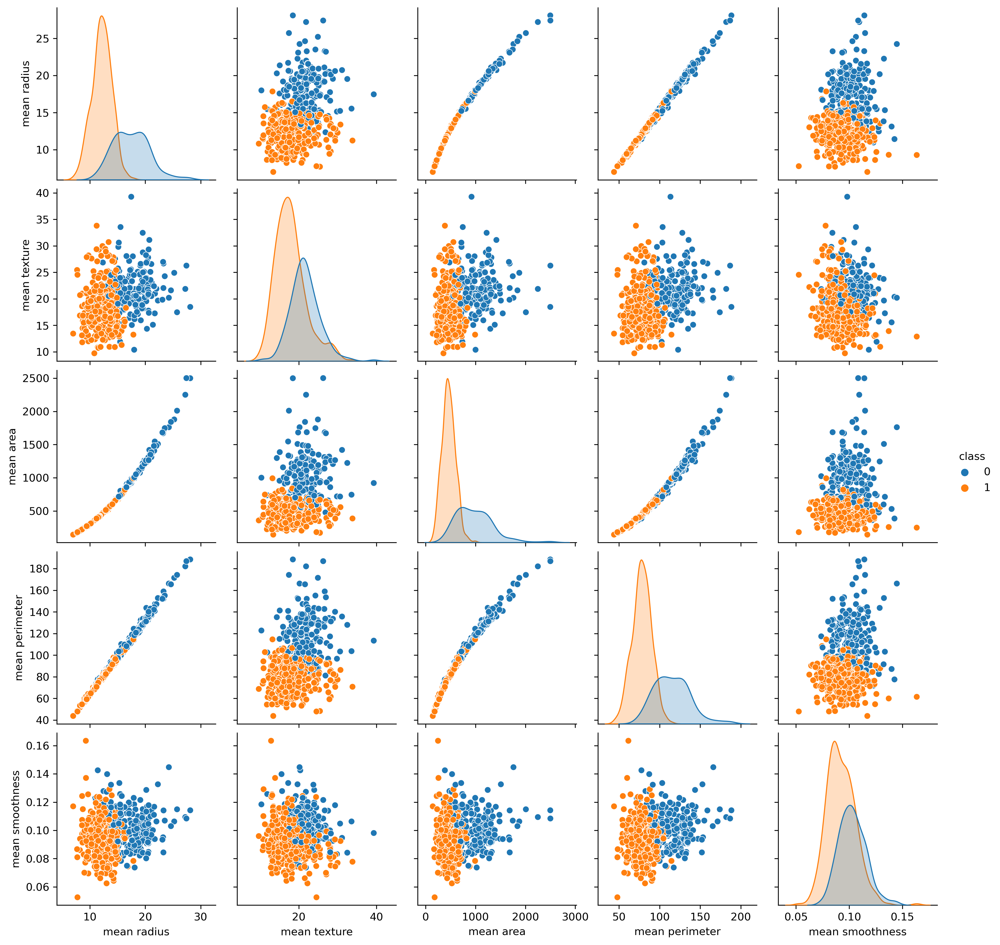

In [38]:
df = pd.DataFrame(X, columns=cancer.feature_names)
df['class'] = cancer.target #y

sns.pairplot(df, hue='class', vars = ['mean radius', 'mean texture', 'mean area',
                                     'mean perimeter', 'mean smoothness'])

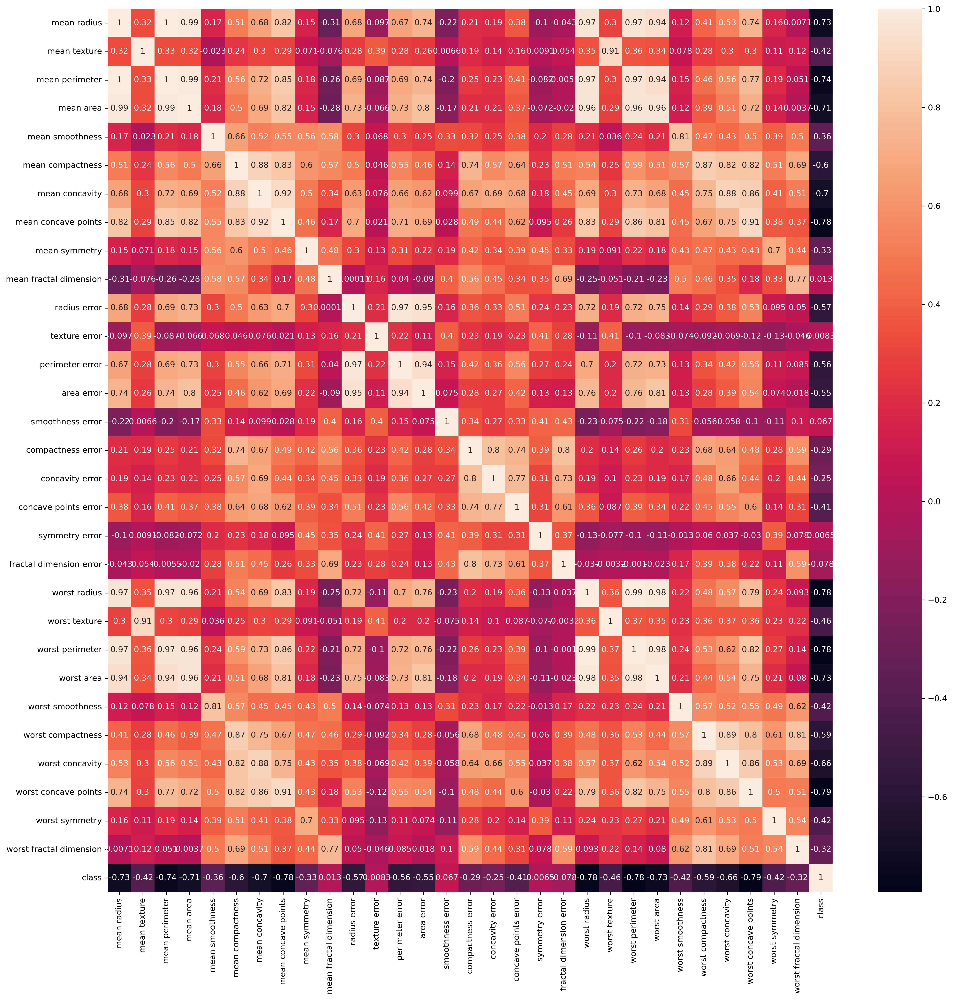

In [41]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True)
plt.savefig('heatmap.jpg')

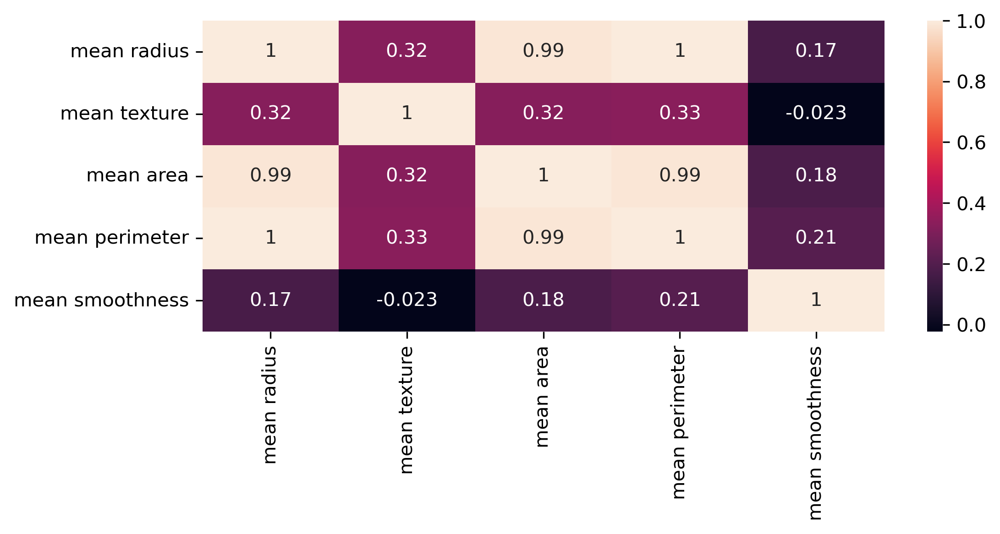

In [43]:
cols = ['mean radius', 'mean texture', 'mean area',
                                     'mean perimeter', 'mean smoothness']
sns.heatmap(df[cols].corr(), annot=True)
plt.savefig('heatmap.jpg')

#### Standardization
This technique is to re-scale features value with the distribution value between 0 and 1

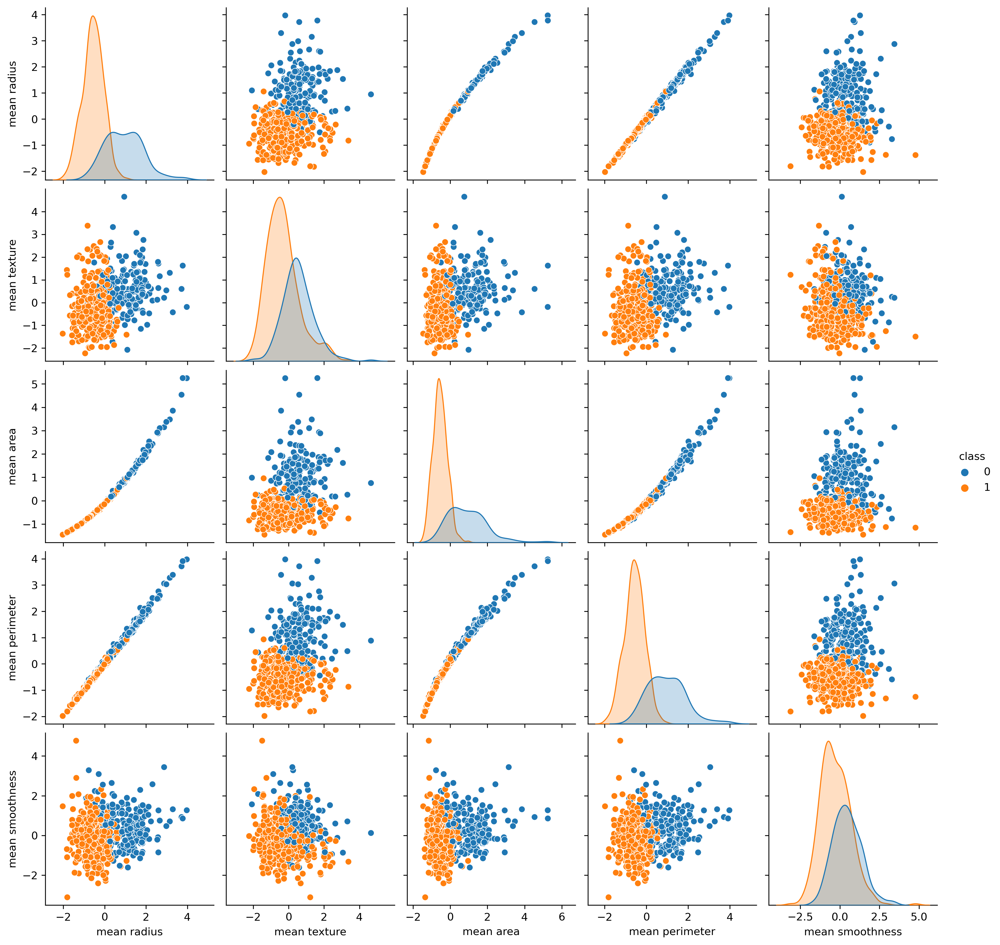

In [47]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
df_ = pd.DataFrame(X_scaled, columns=cancer.feature_names)

df_['class'] = cancer.target #y

sns.pairplot(df_, hue='class', vars = ['mean radius', 'mean texture', 'mean area',
                                     'mean perimeter', 'mean smoothness'])

#### Model Building

In [55]:
df[cancer.feature_names]

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                            random_state=0, stratify=y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

#### SVM Model 

In [60]:
from sklearn import svm

In [84]:
clf = svm.LinearSVC(dual=False)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)

print(metrics.classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        42
           1       0.96      0.96      0.96        72

    accuracy                           0.95       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



In [85]:
print(metrics.confusion_matrix(y_test, y_predict))

[[39  3]
 [ 3 69]]


#### Use Standardized Feature for Training

In [88]:
X.max(), X_train.max()

(4254.0, 4254.0)

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2,
                                            random_state=0, stratify=y)
X.max(), X_train.max(), X_scaled.max()

(4254.0, 11.041842264867746, 12.072680399588076)

In [96]:
clf = svm.LinearSVC(dual=False, max_iter=1000, C=0.5)
clf.fit(X_train, y_train)
y_predict = clf.predict(X_test)

print(metrics.classification_report(y_test, y_predict))
print(metrics.confusion_matrix(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96        42
           1       0.97      0.99      0.98        72

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

[[40  2]
 [ 1 71]]


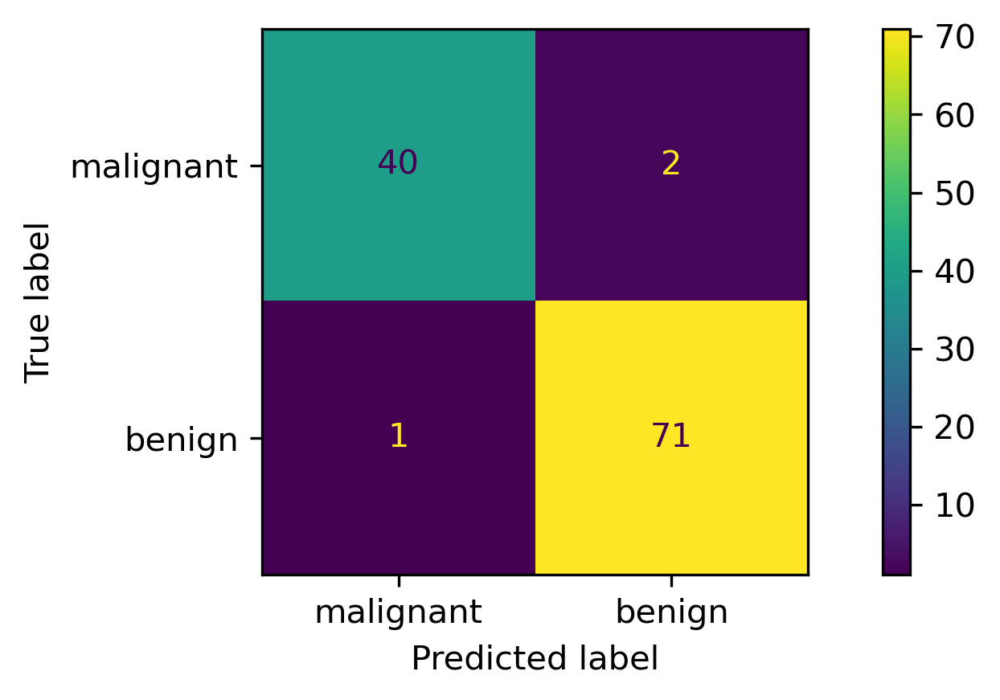

In [98]:
cm = metrics.confusion_matrix(y_test, y_predict)
disp = metrics.ConfusionMatrixDisplay(cm, display_labels=cancer.target_names)
disp.plot()

#### Polynomial, Sigmoid, RBF Kernels 

In [118]:
def train_svm(kernel):
    clf = svm.SVC(kernel=kernel, C=0.8)
    clf.fit(X_train, y_train)
    y_predict = clf.predict(X_test)
    
    print("\n\n********** KERNEL {} **********".format(kernel))
    print(metrics.classification_report(y_test, y_predict))
    print(metrics.confusion_matrix(y_test, y_predict))

In [119]:
for kernel in {'linear', 'poly', 'rbf', 'sigmoid'}:
    train_svm(kernel)



********** KERNEL rbf **********
              precision    recall  f1-score   support

           0       0.95      0.93      0.94        42
           1       0.96      0.97      0.97        72

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114

[[39  3]
 [ 2 70]]


********** KERNEL poly **********
              precision    recall  f1-score   support

           0       1.00      0.79      0.88        42
           1       0.89      1.00      0.94        72

    accuracy                           0.92       114
   macro avg       0.94      0.89      0.91       114
weighted avg       0.93      0.92      0.92       114

[[33  9]
 [ 0 72]]


********** KERNEL linear **********
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        42
           1       0.97      1.00      0.99        72

    accuracy                       

# Other Resources
|  ML Course | Description |
|:---|:---|
| [**Data Visualization in Python Masterclass™: Beginners to Pro**](https://bit.ly/udemy95off_kgptalkie) |  Learn to build Machine Learning and Deep Learning models using Python and its libraries like Scikit-Learn, Keras, and TensorFlow. |
| [**Python for Machine Learning: A Step-by-Step Guide**](https://bit.ly/ml-ds-project) | Learn to build Machine Learning and Deep Learning models using Python and its libraries like Scikit-Learn, Keras, and TensorFlow. |
| [**Python for Linear Regression in Machine Learning**](https://bit.ly/regression-python) | Learn to build Linear Regression models using Python and its libraries like Scikit-Learn. |
| [**Introduction to Spacy 3 for Natural Language Processing**](https://bit.ly/spacy-intro) | Learn to build Natural Language Processing models using Python and its libraries like Spacy. |
| [**Advanced Machine Learning and Deep Learning Projects**](https://bit.ly/kgptalkie_ml_projects) | Learn to build Advanced Machine Learning and Deep Learning models using Python and transformer models like BERT, GPT-2, and XLNet. |
| [**Natural Language Processing in Python for Beginners**](https://bit.ly/intro_nlp) | Learn to build Natural Language Processing Projects using Spacy, NLTK, and Gensim, and transformer models like BERT, GPT-2, and XLNet. |
| [**Deployment of Machine Learning Models in Production in Python**](https://bit.ly/bert_nlp) |  Learn to deploy Machine Learning and Deep Learning models using Python and its libraries like Flask, Streamlit, and NGINX. |
| [**R 4.0 Programming for Data Science - Beginners to Pro**](https://bit.ly/r4-ml) | Learn to build Machine Learning and Deep Learning models using R and its libraries like caret, tidyverse, and keras. |
